In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
import pandas as pd
import plotly.express as px

mpl.rcParams['figure.figsize'] = (10, 8)
mpl.rcParams['axes.grid'] = False


In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/srivatsan88/YouTubeLI/master/dataset/nyc_energy_consumption.csv')

In [3]:
df['timeStamp']=pd.to_datetime(df['timeStamp'])

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49205 entries, 0 to 49204
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timeStamp  49205 non-null  datetime64[ns]
 1   demand     49124 non-null  float64       
 2   precip     48975 non-null  float64       
 3   temp       49019 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.5 MB


In [5]:
df.head()

,timeStamp,demand,precip,temp
0,2012-01-01 00:00:00,4937.5,0.0,46.13
1,2012-01-01 01:00:00,4752.1,0.0,45.89
2,2012-01-01 02:00:00,4542.6,0.0,45.04
3,2012-01-01 03:00:00,4357.7,0.0,45.03
4,2012-01-01 04:00:00,4275.5,0.0,42.61


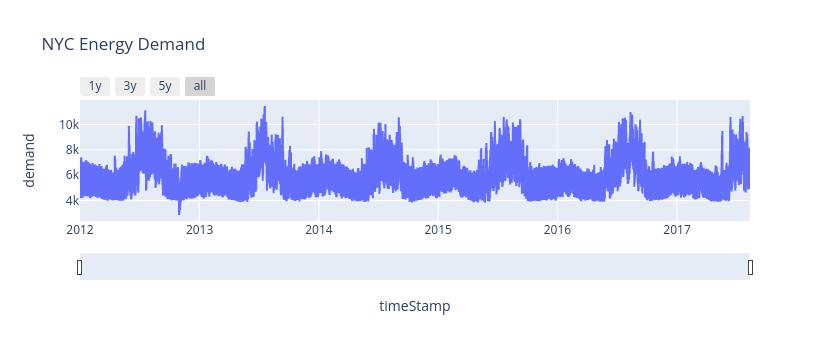

In [6]:
fig = px.line(df, x='timeStamp', y='demand', title='NYC Energy Demand')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="3y", step="year", stepmode="backward"),
            dict(count=3, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [7]:
ny_df = df.copy().set_index('timeStamp')

array([<AxesSubplot: xlabel='timeStamp'>,
       <AxesSubplot: xlabel='timeStamp'>,
       <AxesSubplot: xlabel='timeStamp'>], dtype=object)

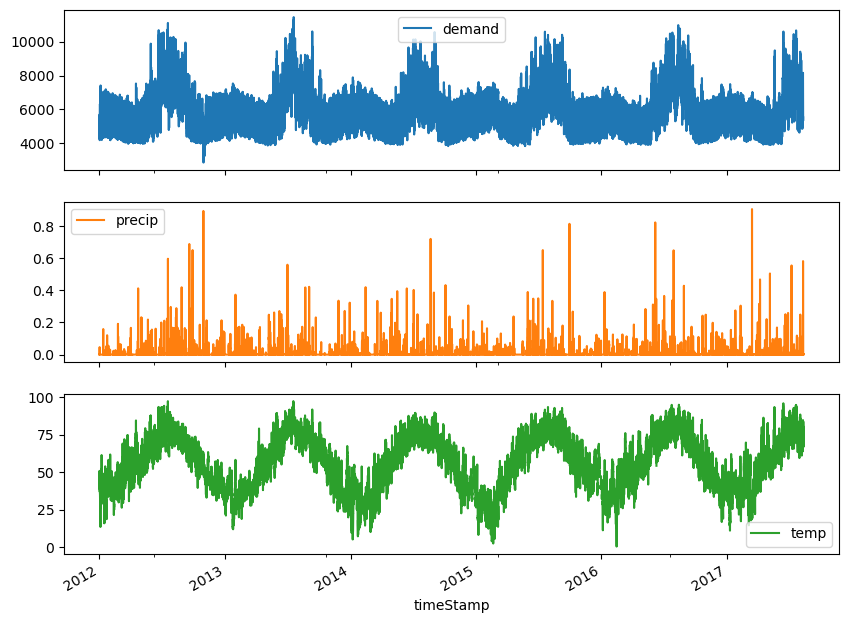

In [8]:
ny_df.plot(subplots=True)

In [9]:
ny_df.resample('D').mean()

,demand,precip,temp
timeStamp,,,
2012-01-01,4954.833333,0.002487,46.510000
2012-01-02,5302.954167,0.000000,40.496667
2012-01-03,6095.512500,0.000000,26.672500
2012-01-04,6336.266667,0.000000,20.585000
2012-01-05,6130.245833,0.000000,33.577500
...,...,...,...
2017-08-08,6471.626042,0.000000,71.039167
2017-08-09,6811.112167,0.047529,73.852500
2017-08-10,5582.297000,0.002033,75.217500


array([<AxesSubplot: xlabel='timeStamp'>,
       <AxesSubplot: xlabel='timeStamp'>,
       <AxesSubplot: xlabel='timeStamp'>], dtype=object)

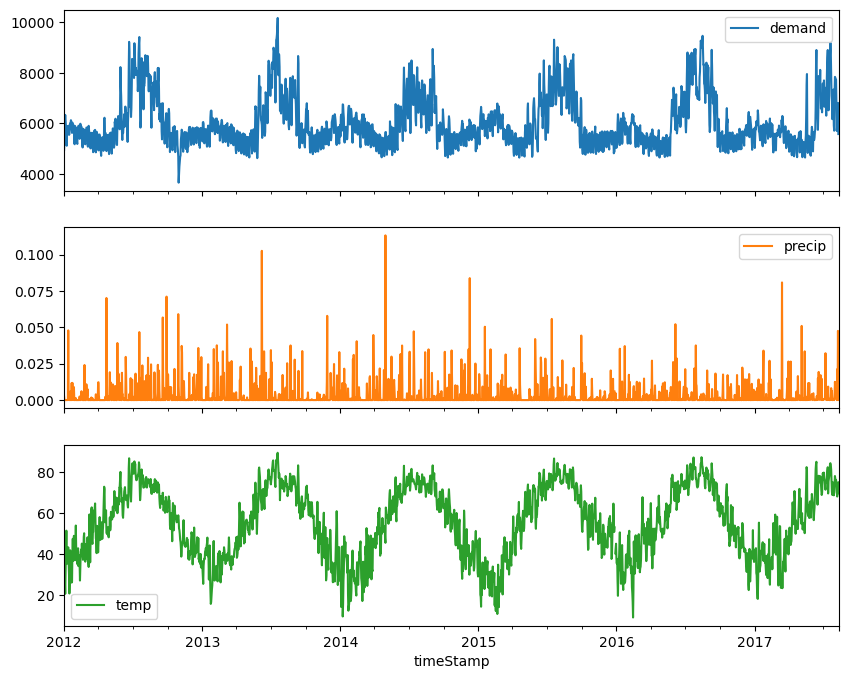

In [10]:
ny_df.resample('D').mean().plot(subplots=True)

In [11]:
ny_df_daily = ny_df.resample('D').mean()

[Prophet Paper](https://peerj.com/preprints/3190.pdf)

In [13]:
try:
  from prophet import Prophet
except:
  !pip install prophet
  from prophet import Prophet

  Using cached prophet-1.1.2-py3-none-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.9 MB)
  Using cached holidays-0.19-py3-none-any.whl (208 kB)
  Using cached LunarCalendar-0.0.9-py2.py3-none-any.whl (18 kB)
  Using cached cmdstanpy-1.1.0-py3-none-any.whl (83 kB)
  Using cached convertdate-2.4.0-py3-none-any.whl (47 kB)
  Using cached PyMeeus-0.5.12.tar.gz (5.8 MB)
  Preparing metadata (setup.py) ... done
  Using cached hijri_converter-2.2.4-py3-none-any.whl (14 kB)
  Using cached korean_lunar_calendar-0.3.1-py3-none-any.whl (9.0 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 12.7 MB/s eta 0:00:0031m9.8 MB/s eta 0:00:01
  Created wheel for pymeeus: filename=PyMeeus-0.5.12-py3-none-any.whl size=732001 sha256=120f2e523ca8e8cb1c20d4021e5632d4ec9c1512789accb7fe92fdabec6c98dc
  Stored in directory: /home/biscotty/.cache/pip/wheels/9b/0a/31/eb0e590d74ec13e90493cb6d1cd92a379a1a3b8f12ed778a14
Successfully built pymeeus


**Prophet expects 2 columns named ds and y**

In [15]:
ny_df_final=ny_df_daily.reset_index()[['timeStamp','demand']].rename({'timeStamp':'ds','demand':'y'}, axis='columns')
     

In [16]:
ny_df_final

,ds,y
0,2012-01-01,4954.833333
1,2012-01-02,5302.954167
2,2012-01-03,6095.512500
3,2012-01-04,6336.266667
4,2012-01-05,6130.245833
...,...,...
2046,2017-08-08,6471.626042
2047,2017-08-09,6811.112167
2048,2017-08-10,5582.297000
2049,2017-08-11,NaN


Unlike ARIMA Prophet takes care of null values

In [17]:
train=ny_df_final[(ny_df_final['ds'] >= '2012-01-01') & (ny_df_final['ds'] <= '2017-04-30')]
test=ny_df_final[(ny_df_final['ds'] > '2017-04-30')]

In [18]:
train.shape

(1947, 2)

In [19]:
test.shape

(104, 2)

In [20]:
test

,ds,y
1947,2017-05-01,5417.231583
1948,2017-05-02,5697.950042
1949,2017-05-03,5354.628500
1950,2017-05-04,5235.704833
1951,2017-05-05,5358.639500
...,...,...
2046,2017-08-08,6471.626042
2047,2017-08-09,6811.112167
2048,2017-08-10,5582.297000
2049,2017-08-11,NaN


In [21]:
m = Prophet(interval_width=0.95,yearly_seasonality=True)

Prophet uses a default confidence level (width) of 0.8

In [22]:
m.fit(train)

22:53:51 - cmdstanpy - INFO - Chain [1] start processing
22:53:51 - cmdstanpy - INFO - Chain [1] done processing


In [24]:
m.params

OrderedDict([('lp__', array([[5009.78]])),
             ('k', array([[0.0890183]])),
             ('m', array([[0.593362]])),
             ('delta',
              array([[ 1.10520e-07, -2.50886e-04, -1.01936e-01, -2.76920e-05,
                       3.40496e-08, -1.96221e-08, -7.43167e-08, -3.63834e-08,
                       8.22848e-08, -1.00126e-07, -3.21144e-02, -7.26889e-02,
                      -4.25869e-06, -1.16177e-08,  2.44121e-01,  1.43109e-02,
                      -6.65350e-08, -9.95382e-02, -6.23832e-02, -2.28995e-08,
                       1.03571e-08,  2.19057e-09,  2.63178e-02,  2.29535e-03,
                       3.97253e-07]])),
             ('sigma_obs', array([[0.0459082]])),
             ('beta',
              array([[-0.0346854 , -0.070557  ,  0.0575954 ,  0.0470765 , -0.0140567 ,
                      -0.00500029, -0.00387049, -0.00074428,  0.00241275, -0.00755457,
                       0.00405657,  0.00483139, -0.00789669, -0.00470522,  0.00701707,
          

`make_future_predictions` periods match number of rows in test data

In [25]:
future = m.make_future_dataframe(periods=104)
future.tail()

,ds
2046,2017-08-08
2047,2017-08-09
2048,2017-08-10
2049,2017-08-11
2050,2017-08-12


In [26]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2046,2017-08-08,7595.430554,6704.702812,8511.848692
2047,2017-08-09,7584.564328,6726.963467,8550.559757
2048,2017-08-10,7539.300012,6562.149480,8445.667751
2049,2017-08-11,7494.535416,6520.110712,8393.781919
2050,2017-08-12,6919.723481,5968.120674,7853.975517


<AxesSubplot: xlabel='ds'>

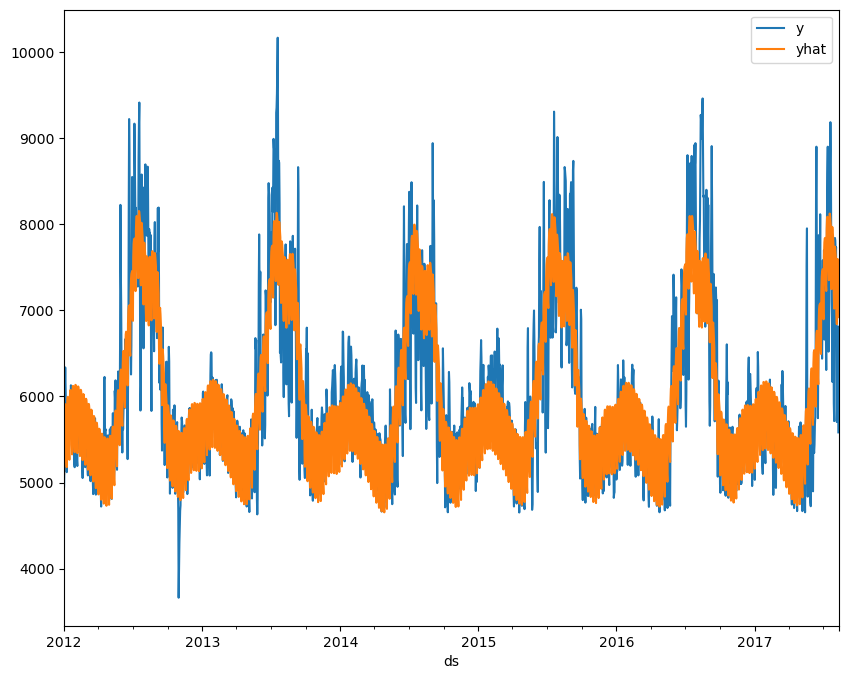

In [27]:
pd.concat([ny_df_final.set_index('ds')['y'],
           forecast.set_index('ds')['yhat']],
           axis=1).plot()

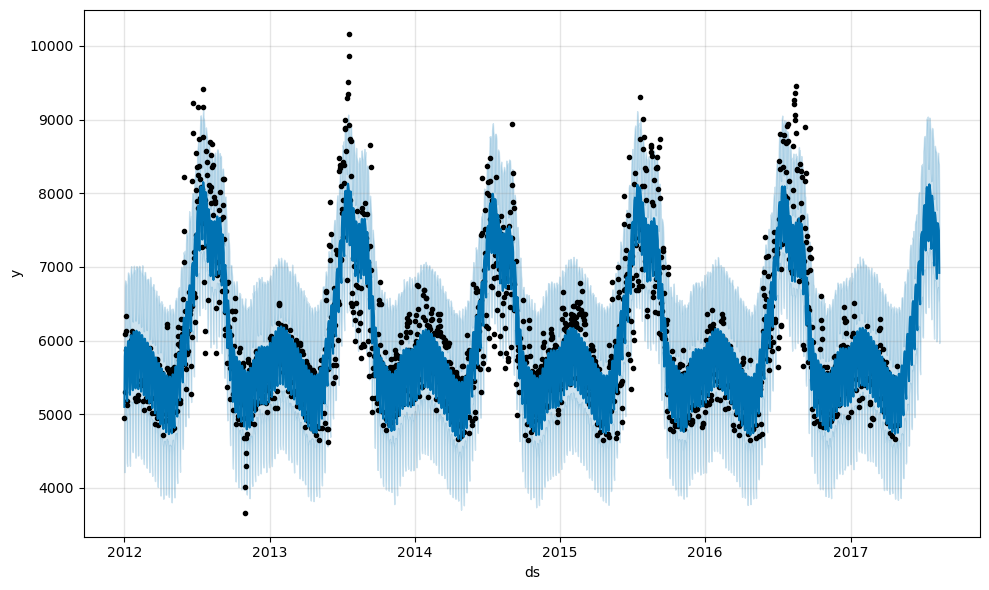

In [28]:
fig1 = m.plot(forecast)

Dark blue is forecast value, light blue is 95% confidence

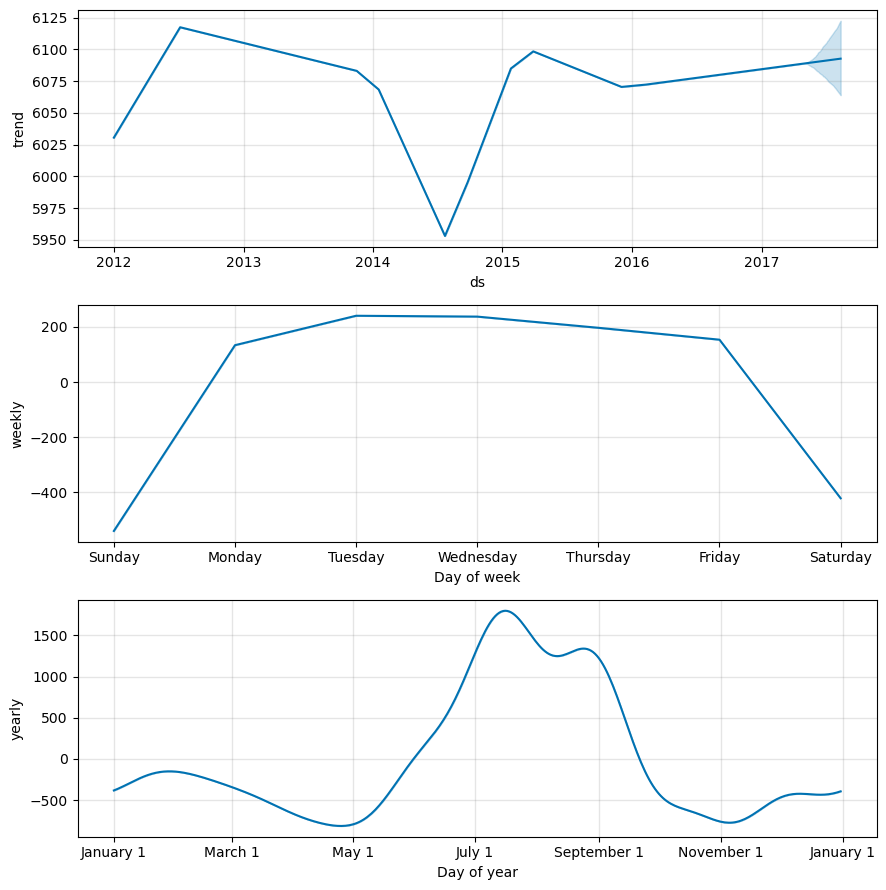

In [29]:
fig2 = m.plot_components(forecast)

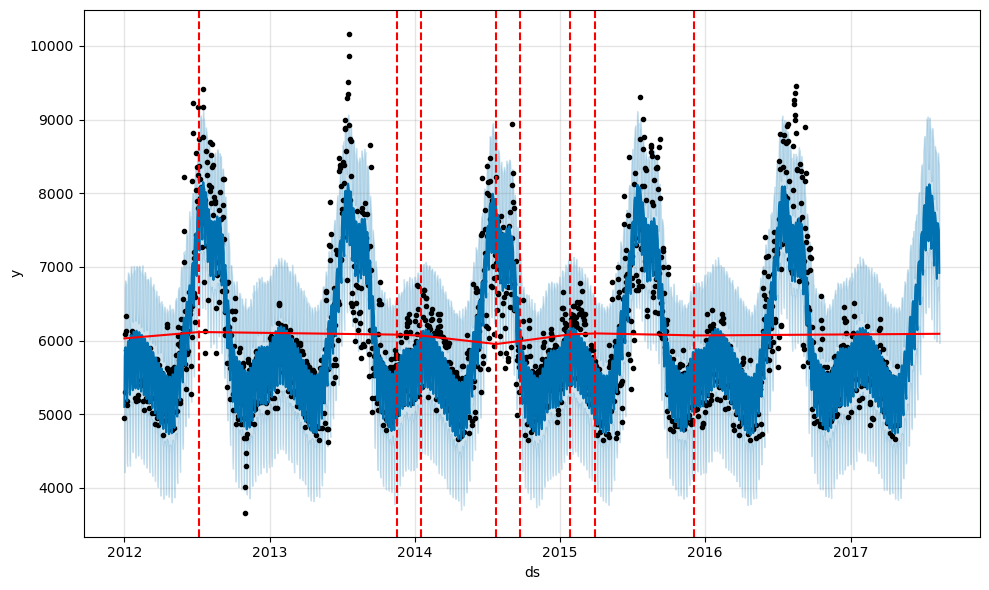

In [30]:
from prophet.plot import add_changepoints_to_plot
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

In [31]:
deltas = m.params['delta'].mean(0)
deltas

array([ 1.10520e-07, -2.50886e-04, -1.01936e-01, -2.76920e-05,
        3.40496e-08, -1.96221e-08, -7.43167e-08, -3.63834e-08,
        8.22848e-08, -1.00126e-07, -3.21144e-02, -7.26889e-02,
       -4.25869e-06, -1.16177e-08,  2.44121e-01,  1.43109e-02,
       -6.65350e-08, -9.95382e-02, -6.23832e-02, -2.28995e-08,
        1.03571e-08,  2.19057e-09,  2.63178e-02,  2.29535e-03,
        3.97253e-07])

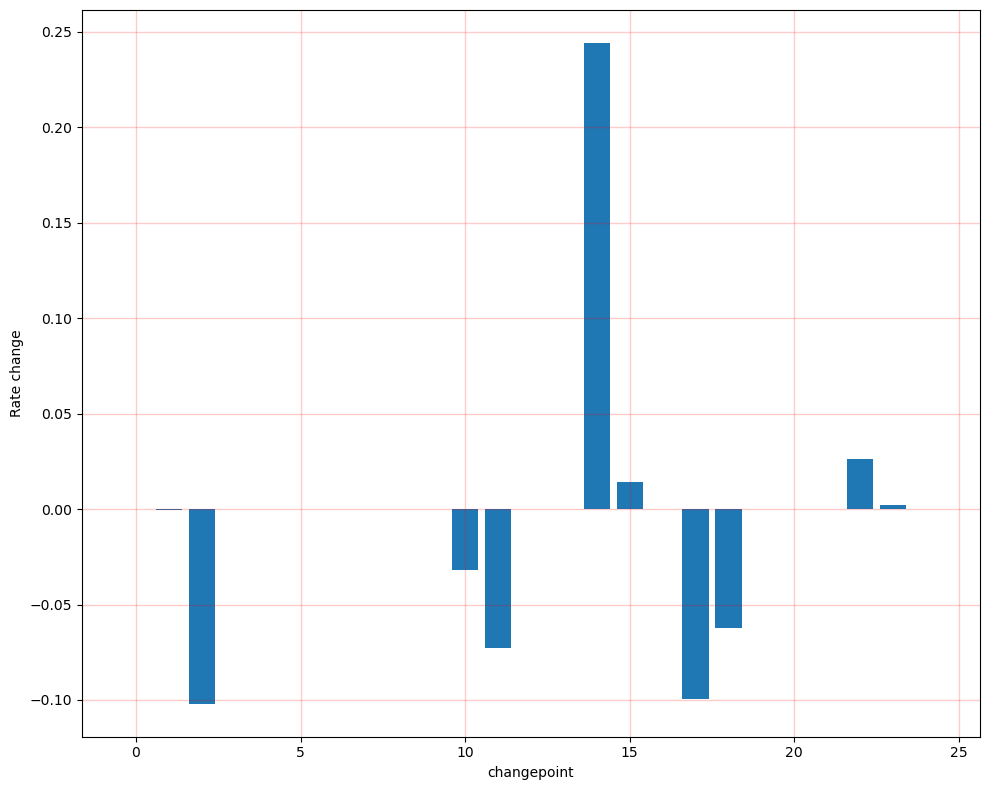

In [32]:
fig = plt.figure(facecolor='w')
ax = fig.add_subplot(111)
ax.bar(range(len(deltas)), deltas)
ax.grid(True, 
        which='major',
        c='red',
        ls='-',
        lw=1,
        alpha=0.2)
ax.set_ylabel('Rate change')
ax.set_xlabel('changepoint')
fig.tight_layout()

In [33]:
m.changepoints

62     2012-03-03
124    2012-05-04
187    2012-07-06
249    2012-09-06
311    2012-11-07
373    2013-01-08
436    2013-03-12
498    2013-05-13
560    2013-07-14
622    2013-09-14
685    2013-11-16
747    2014-01-17
809    2014-03-20
871    2014-05-21
934    2014-07-23
996    2014-09-23
1058   2014-11-24
1120   2015-01-25
1183   2015-03-29
1245   2015-05-30
1307   2015-07-31
1369   2015-10-01
1432   2015-12-03
1494   2016-02-03
1556   2016-04-05
Name: ds, dtype: datetime64[ns]

23:15:55 - cmdstanpy - INFO - Chain [1] start processing
23:15:55 - cmdstanpy - INFO - Chain [1] done processing


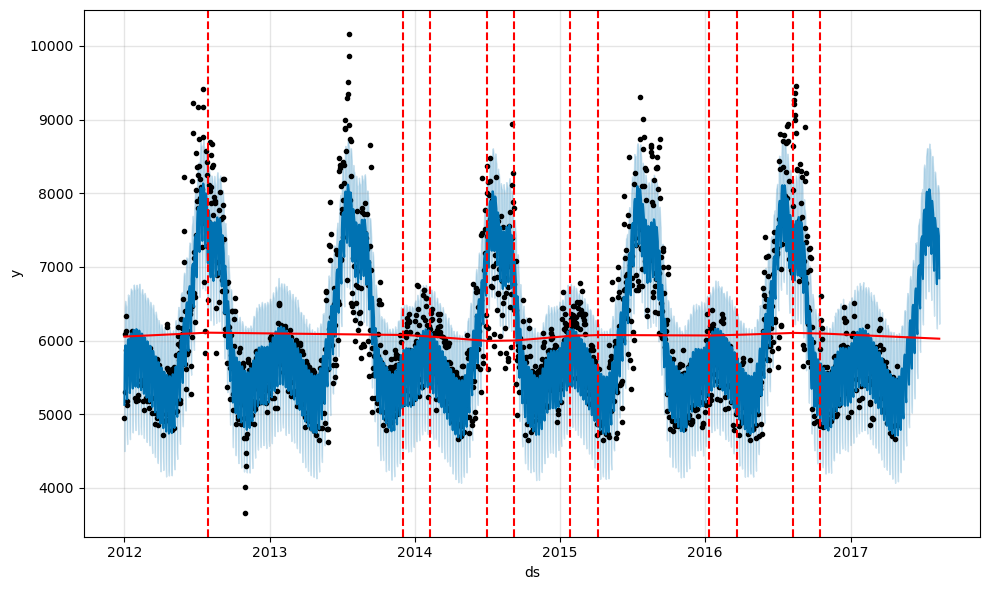

In [34]:
pro_change = Prophet(changepoint_range=0.9, yearly_seasonality=True)
forecast = pro_change.fit(train).predict(future)
fig = pro_change.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast)

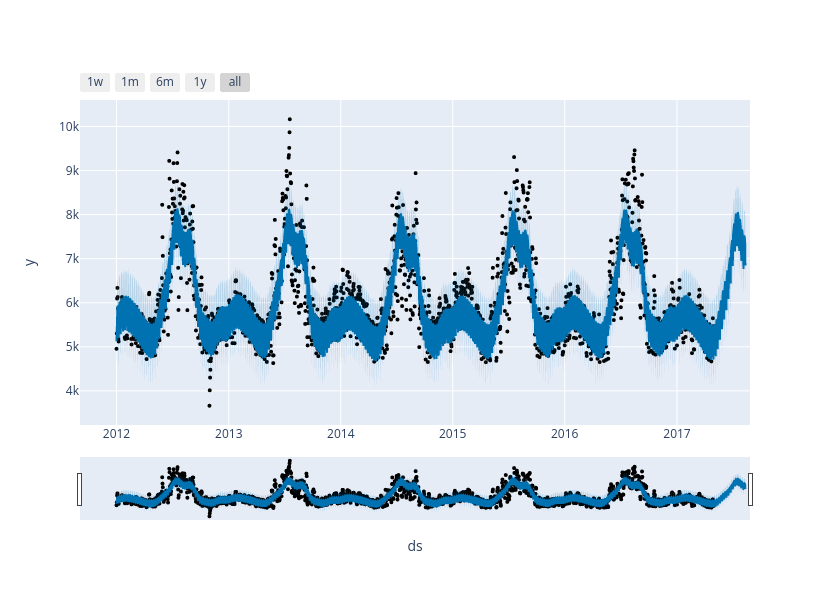

In [35]:
from prophet.plot import plot_plotly
import plotly.offline as py

fig = plot_plotly(m, forecast)
py.iplot(fig)

In [36]:
from prophet.diagnostics import cross_validation
cv_results = cross_validation(model=m,
                              initial='731 days',
                              horizon='365 days')

  0%|          | 0/5 [00:00<?, ?it/s]

23:19:29 - cmdstanpy - INFO - Chain [1] start processing
23:19:30 - cmdstanpy - INFO - Chain [1] done processing
23:19:30 - cmdstanpy - INFO - Chain [1] start processing
23:19:30 - cmdstanpy - INFO - Chain [1] done processing
23:19:30 - cmdstanpy - INFO - Chain [1] start processing
23:19:30 - cmdstanpy - INFO - Chain [1] done processing
23:19:30 - cmdstanpy - INFO - Chain [1] start processing
23:19:30 - cmdstanpy - INFO - Chain [1] done processing
23:19:30 - cmdstanpy - INFO - Chain [1] start processing
23:19:30 - cmdstanpy - INFO - Chain [1] done processing


In [37]:
cv_results.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2014-05-02,5563.230718,4751.184207,6366.534214,5460.325000,2014-05-01
1,2014-05-03,4973.302233,4116.639900,5811.131090,4893.683333,2014-05-01
2,2014-05-04,4849.530668,3934.965364,5590.582339,4764.137500,2014-05-01
3,2014-05-05,5530.474011,4651.697777,6335.364211,5406.762500,2014-05-01
4,2014-05-06,5625.448152,4822.620850,6498.203892,5409.750000,2014-05-01


In [38]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(cv_results)
df_p

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,36 days 12:00:00,252845.303513,502.837254,407.484654,0.073249,0.065546,0.072278,0.884615
1,37 days 00:00:00,259563.824792,509.474067,414.853663,0.074531,0.066277,0.073476,0.879121
2,37 days 12:00:00,261906.903684,511.768408,418.269998,0.075120,0.067515,0.074093,0.879121
3,38 days 00:00:00,264685.735762,514.476176,421.366125,0.075382,0.068467,0.074330,0.879121
4,38 days 12:00:00,268421.434232,518.094040,426.626848,0.076223,0.068773,0.075198,0.879121
...,...,...,...,...,...,...,...,...
653,363 days 00:00:00,259098.543751,509.017233,446.792489,0.082462,0.082627,0.081606,0.983516
654,363 days 12:00:00,260919.958810,510.803249,447.943930,0.082667,0.083414,0.081906,0.983516
655,364 days 00:00:00,265294.381560,515.067356,451.511762,0.083509,0.084946,0.082753,0.983516
656,364 days 12:00:00,265455.121456,515.223370,451.291455,0.083506,0.084946,0.082835,0.983516
